## Codes for JIA synovium study 
### Spatial association between macrophages and endothelial cells and Colocalization score analysis

*Jun Inamo*

*jun.inamo@cuanschutz.edu*

*Computational Omics and Systems Immunology (COSI) Lab, Division of Rheumatology and Center for Health AI, University of Colorado School of Medicine, CO, USA*


In [1]:
format(Sys.Date(), "%Y-%m-%d")

[1] "2025-07-09"

In [2]:
options(warn = -1)  
options("verbose" = FALSE)
options("show.error.messages" = TRUE)  
Sys.setlocale("LC_CTYPE", "en_US.UTF-8")

[1] "en_US.UTF-8"

In [3]:
suppressMessages({
    source("./utils.R")
    library(gridExtra)
})

Load Seurat object of QCed data

In [4]:
ste = readRDS(paste0("./output/Xenium_merged_final.rds"))
DefaultAssay(ste) = "SCT"

Assign annotated cluster names

In [5]:
celltype="ALL"
resolution <- switch(celltype,
                     "ALL" = "0.20",
                     "T" = "1.00",
                     "M" = "0.20",
                     "B" = "0.40",
                     "Tissue" = "0.60"
)

cluster_col = "res_subtype" 
Idents(ste) = factor(ste@meta.data[,cluster_col])
DefaultAssay(ste) = "SCT"

cluster_df = read.csv("./cluster_annotation.csv")

cluster_COLORS <- manual_colors[1:length(unique(Idents(ste)))]
names(cluster_COLORS) = levels(Idents(ste))

cur_levels <- levels(Idents(ste))
df <- data.frame(level = cur_levels, stringsAsFactors = FALSE)
df$prefix <- sub("^([^-]+)-.*", "\\1", df$level)
df$num <- as.integer(sub("^[^-]+-(\\d+):.*", "\\1", df$level))
prefix_order <- c("T", "B", "M", "Tissue")
df$prefix_factor <- factor(df$prefix, levels = prefix_order)
df_sorted <- df[order(df$prefix_factor, df$num), ]
new_levels <- df_sorted$level
Idents(ste) <- factor(Idents(ste), levels = new_levels)

T_grad <- colorRampPalette(c("#ACD9AE99", "#358A3999"))(25)
Tissue_grad <- colorRampPalette(c("#FFEBED99", "#B71B1B99"))(25)
B_grad <- colorRampPalette(c("#C8B9E599", "#311A9299"))(25)
M_grad <- colorRampPalette(c("gold", "goldenrod3"))(25)
cluster_COLORS_ = c(T_grad[1:length(grep("^T-",levels(Idents(ste))))],
                    B_grad[1:length(grep("^B-",levels(Idents(ste))))],
                    M_grad[1:length(grep("^M-",levels(Idents(ste))))],
                    Tissue_grad[1:length(grep("^Tissue-",levels(Idents(ste))))])
names(cluster_COLORS_) = levels(Idents(ste))
cluster_COLORS_[grepl("venule",names(cluster_COLORS_))] = "grey40"
cluster_COLORS_[grepl("arteriolar",names(cluster_COLORS_))] = "grey70"
cluster_COLORS_[grepl("lymphatic",names(cluster_COLORS_))] = "grey90"
cluster_COLORS_[grepl("mixed",names(cluster_COLORS_))] = "white"

clus = ste@meta.data[,cluster_col] %>% 
  unique() %>%
  stringr::str_split(.,pattern = ":", simplify = TRUE) %>%
  .[,2]
cluster_COLORS__ = manual_colors
names(cluster_COLORS__) = clus
cluster_COLORS__ = na.omit(cluster_COLORS__)

cluster_colors_df <- data.frame(
  cluster =  ste@meta.data[,cluster_col] %>% 
    unique(),
  color = cluster_COLORS__[!is.na(names(cluster_COLORS__))],
  stringsAsFactors = FALSE
)

cluster_colors_df$clean_name <- sub("^[^:]+:", "", cluster_colors_df$cluster)

cluster_colors_mod_df <- data.frame(
  cluster = names(cluster_COLORS_),
  color = cluster_COLORS_,
  stringsAsFactors = FALSE
)

cluster_colors_mod_df$clean_name <- sub("^[^:]+:", "", cluster_colors_mod_df$cluster)

replace_indices <- cluster_colors_df$clean_name %in% cluster_colors_df$clean_name

cluster_colors_df$color[replace_indices] <- cluster_colors_mod_df$color[match(cluster_colors_df$clean_name[replace_indices], cluster_colors_mod_df$clean_name)]

cluster_COLORS__ <- setNames(cluster_colors_df$color, cluster_colors_df$clean_name)


ste@meta.data$new_cluster = factor(stringr::str_split(ste@meta.data$res_subtype,pattern=":",simplify=TRUE)[,2], 
                                   levels = unique(stringr::str_split(levels(Idents(ste)),pattern=":",simplify=TRUE)[,2])) 
Idents(ste) = ste@meta.data$new_cluster

ord = levels(Idents(ste))
ord = c(ord[!grepl("venule|arteriolar|lymphatic|mixed",ord)],
        ord[grepl("venule|arteriolar|lymphatic|mixed",ord)])
Idents(ste) = factor(Idents(ste), levels = ord)
ord = levels(Idents(ste))
ord = c(ord[!grepl("mixed",ord)],
        ord[grepl("mixed",ord)])
Idents(ste) = factor(Idents(ste), levels = ord)

cluster_COLORS__ = cluster_COLORS__[levels(Idents(ste))]
cluster_COLORS__tmp = cluster_COLORS__
names(cluster_COLORS__tmp) = c("CD4 naïve","CD4 memory","Treg","TPH_TFH","Th1-like Tph",
                               "CD8 naïve","GZMK+ CD8","GZMB+ CD8","IFN stimulated CD8 memory","TRM","Innate-like T",
                               "gdT",
                               "ILCs",
                               "NK cells",
                               "B","plasmablast","plasma",
                               "MERTK+ macrophage","TREM2+ macrophage","pro-inflammatory  macrophage","stressed macrophage",
                               "DC1","DC2","pDC","mregDC","mast cell",
                               "proliferating cells",
                               "PRG4+ lining fibroblast","PRG4+DKK3+ lining fibroblast",
                               "CXCL12+DKK3+ intermediate fibroblast","RSPO3+ intermediate fibroblast",
                               "POSTN+ sublining fibroblast","NOTCH3+ sublining fibroblast","CD34+PI16+DPP4+ sublining","CXCL12+ sublining fibroblast",
                               "muscle",
                               "venule","NOTCH4+ arteriolar","lymphatic",
                               "mixed")
cluster_COLORS__ = cluster_COLORS__tmp
cluster_COLORS__[names(cluster_COLORS__)=="NK cells"]="turquoise"
cluster_COLORS__[names(cluster_COLORS__)=="ILCs"]="darkblue"
Idents(ste) = factor(Idents(ste), levels = names(cluster_COLORS__))

cluster_col = "new_cluster"

In [6]:
table(Idents(ste))
sum(table(Idents(ste)))


                           CD4 naïve                           CD4 memory 
                                 624                                 5828 
                                Treg                              TPH_TFH 
                                2150                                 1828 
                        Th1-like Tph                            CD8 naïve 
                                 793                                 3425 
                           GZMK+ CD8                            GZMB+ CD8 
                                9680                                  477 
           IFN stimulated CD8 memory                                  TRM 
                                 794                                 1463 
                       Innate-like T                                  gdT 
                                 895                                 2210 
                                ILCs                             NK cells 
                        

[1] 430119

### Gradient of gene expression in macrophages by distance to endothelial cells

In [7]:
max_dist = 300

mac_cells <- ste@meta.data %>% 
  dplyr::filter(grepl("macrophage",!!sym(cluster_col))) %>%
  rownames()

ste_ = subset(ste, cells = mac_cells)


coords_df = data.frame()
for (name in c("SB4","SB14","SB10","SB19","SB25","SB21","SB29","SB30","SB62")) {
  coords <- ste[[name]]$centroids@coords %>%
    as.data.frame() %>%
    dplyr::mutate(cell = Cells(ste[[name]]))
  cells <- coords$cell
  rownames(coords) <- cells
  coords <- as.matrix(coords[, c("x", "y")])
  dim(coords)
  coords_df_ = as.data.frame(coords) %>%
    dplyr::mutate(cell_id = cells,
                  sample_id = name) %>%
    dplyr::left_join(.,ste@meta.data[,c("cell",cluster_col)] %>% dplyr::rename(cell_id = cell),by="cell_id")
  
  end_cells <- coords_df_ %>% dplyr::filter(grepl("arteriolar|venule",!!sym(cluster_col)))
  mac_cells <- coords_df_ %>% dplyr::filter(grepl("macrophage",!!sym(cluster_col)))
  
  res <- RANN::nn2(data = end_cells[,1:2], query = mac_cells[,1:2], k = 1)
  
  dist_to_nearest_end <- res$nn.dists[, 1]  
  
  mac_cells$dist_nearest_end <- dist_to_nearest_end
  
  coords_df = rbind(coords_df, mac_cells)
}
coords_df = coords_df %>%
  dplyr::left_join(.,
                   t(ste[["SCT"]]$data[,coords_df$cell_id]) %>%
                     as.data.frame() %>%
                     dplyr::mutate(cell_id = coords_df$cell_id),
                   by="cell_id")
coords_df = coords_df %>%
  dplyr::filter(dist_nearest_end < max_dist) 
coords_df[1:5,1:10]


,x,y,cell_id,sample_id,new_cluster,dist_nearest_end,A2ML1,AAMP,AAR2,AARSD1
,<dbl>,<dbl>,<chr>,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,2503.554,667.96228,SB4_aabgdeom-1,SB4,MERTK+ macrophage,44.2230,0,0,0,0
2,3295.951,608.18121,SB4_aacpdggf-1,SB4,MERTK+ macrophage,102.4891,0,0,0,0
3,2868.251,56.21568,SB4_aadfdgea-1,SB4,pro-inflammatory macrophage,183.9111,0,0,0,0
4,2967.490,160.63007,SB4_aadhgeep-1,SB4,MERTK+ macrophage,150.8868,0,0,0,0
5,3041.965,402.60785,SB4_aadncofa-1,SB4,MERTK+ macrophage,117.1691,0,0,0,0


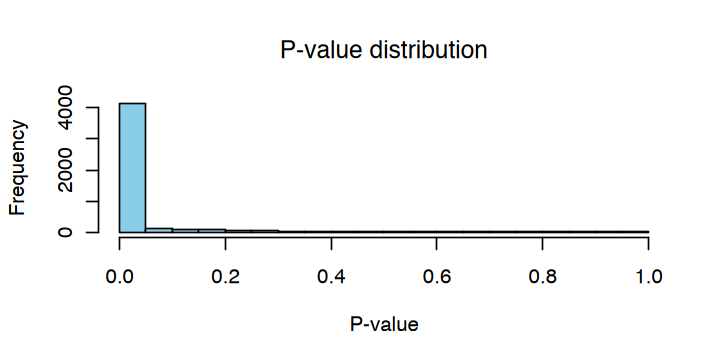

In [8]:
gene_cols <- names(coords_df)[7:ncol(coords_df)]

res_list <- lapply(gene_cols, function(g) {
  test_res <- cor.test(coords_df[["dist_nearest_end"]], coords_df[[g]], 
                       method = "spearman",  
                       use = "pairwise.complete.obs")
  c(correlation = test_res$estimate, pval = test_res$p.value)
})

res_cor_df <- do.call(rbind, res_list) |> 
  as.data.frame()

res_cor_df$gene <- gene_cols
options(repr.plot.width = 6, repr.plot.height = 3)
hist(res_cor_df$pval, breaks = 20, col = "skyblue", main = "P-value distribution", xlab = "P-value")


In [9]:

res_cor_df$adj_pval <- p.adjust(res_cor_df$pval, method = "BH")

sig_genes = res_cor_df %>%
  dplyr::filter(adj_pval < 0.05) %>%
  dplyr::arrange(-correlation.rho) %>%
  pull(gene)

pt.matrix <- ste_[["SCT"]]$data[sig_genes,coords_df$cell_id[order(coords_df$dist_nearest_end)]]

pt.matrix <- t(apply(pt.matrix,1,function(x){smooth.spline(x,df=3)$y}))
pt.matrix <- t(apply(pt.matrix,1,function(x){(x-mean(x))/sd(x)}))
colnames(pt.matrix) = coords_df$cell_id[order(coords_df$dist_nearest_end)]
#pt.matrix[1:5,1:5]

set.seed(1234)
kmeans_res <- kmeans(pt.matrix, centers = 100)
clusters <- kmeans_res$cluster  

pt_vec <- coords_df$dist_nearest_end
names(pt_vec) <- coords_df$cell_id
pt_vec <- pt_vec[colnames(pt.matrix)]
n_bins <- 50
pt_cut <- cut(pt_vec, breaks = n_bins, labels = FALSE, include.lowest = TRUE)
names(pt_cut) <- names(pt_vec)

df_mat <- as.data.frame(pt.matrix)  
colnames(df_mat) <- colnames(pt.matrix)
rownames(df_mat) <- rownames(pt.matrix)

cell_ids <- colnames(df_mat)
cell_bin <- data.frame(
  cell_id = cell_ids,
  bin_id  = pt_cut[cell_ids]  
)


df_long <- df_mat %>%
  mutate(gene = rownames(df_mat)) %>%
  tidyr::pivot_longer(
    -gene, names_to = "cell_id", values_to = "expr"
  )

df_long <- left_join(df_long, cell_bin, by="cell_id")

df_bin_gene <- df_long %>%
  group_by(bin_id, gene) %>%
  summarise(mean_expr = mean(expr, na.rm=TRUE), .groups="drop")

gene_cluster <- data.frame(
  gene = names(clusters),
  cluster_id = clusters
)

df_bin_cluster <- df_bin_gene %>%
  left_join(gene_cluster, by="gene") %>%
  group_by(cluster_id, bin_id) %>%
  summarise(
    cluster_bin_expr = mean(mean_expr, na.rm=TRUE),
    .groups="drop"
  )

df_peak_bin <- df_bin_cluster %>%
  group_by(cluster_id) %>%
  slice_max(order_by = cluster_bin_expr, with_ties = FALSE)

df_peak_bin_ordered <- df_peak_bin %>%
  arrange(bin_id)  

my_order <- df_peak_bin_ordered$cluster_id

cluster_factor <- factor(clusters, levels=my_order)

# M1 & M2 macro gene list
## Front Immunol. 2019 May 24;10:1084. doi: 10.3389/fimmu.2019.01084.
## Clin Sci (Lond). 2023 Aug 2;137(15):1067–1093. doi: 10.1042/CS20220531
m1_marker_genes <- c(
  "ZBP1", "AW112010", "LMO4", "ACSL1", "RSAD2", "TAP2", "SLC31A1", "VCAM1", "BATF", "PSMB9",
  "RAB32", "NUPR1", "IGTP", "SLC25A37", "AGRN", "CD86", "SLFN2", "SERPINE1", "PVR", "CXCL16",
  "RNF114", "CCND2", "PDPN", "CCRL2", "FLNB", "SLFN1", "DENR", "ZUFSP", "MAP3K5", "ST3GAL3",
  "BATF2", "IL17RA", "SLC15A3", "GADD45B", "RBPMS", "INHBA", "TRAF1", "ELL2", "NFKB2", "VASP",
  "EHD1", "ISG20", "GGCT", "LCN2", "PTGES", "BIRC3", "IFNAR2", "IL1RN", "CD274", "NOTCH1",
  "IFI35", "GPR84", "TAPBPL", "IFIT2", "SAMSN1", "ICAM1", "DDX60", "IL12B", "IL12A", "CD14",
  "ITGA5", "DUSP2", "EIF2AK2", "PILRA", "NFKBIZ", "AGTRAP", "CFLAR", "TNIP1", "TNFRSF1B", "NFKBIB",
  "TLR2", "NFKBIA", "VCAN", "MMP14", "OAS3", "CPD", "ADORA2A", "JDP2", "IRF9", "IRF7",
  "MITD1", "GAS7", "MEFV", "CD40", "CXCL9", "GRAMD1A", "EBI3", "MTDH", "SOCS3", "PSTPIP2",
  "ACP5", "CD38", "SKIL", "IL15RA", "SERPINB2", "STAT1", "ARG2", "SYK", "GCH1", "STAT2",
  "SNX20", "HCK", "PARP9", "SOD2", "MS4A6C", "SLCO3A1", "PELI1", "MET", "HDC", "SNX10",
  "ITGAL", "PTGS2", "IFIH1", "PSMB8", "DHX58", "TRIM25", "JAK2"
)
m1_marker_genes <- intersect(m1_marker_genes, rownames(ste[["SCT"]]$data))

m2_marker_genes <- c(
  "CSF1R","MRC1", "PPARG", "ARG1", "CD163", "CLEC10A", "CLEC7A", 
  "PDCD1LG2", "CCL17", "CCL24", "CCL10", "CCL11", "CCL5", "CCL16", "CCL22", "FCGR3A", "IL13", "IL10", "IL4", "IRF4", "STAT6", "PDGFB"
)
m2_marker_genes <- intersect(m2_marker_genes, rownames(ste[["SCT"]]$data))

ccl = rownames(pt.matrix) %in% c(m1_marker_genes,"CD68")
ccl_m2 = rownames(pt.matrix) %in% c(m2_marker_genes, "TREM2","MERTK")

ha = HeatmapAnnotation(distance_to_end = coords_df$dist_nearest_end[order(coords_df$dist_nearest_end)],
                       col = list(distance_to_end = colorRamp2(c(0, max(coords_df$dist_nearest_end)), c("grey90", "darkblue"))),
                       simple_anno_size = unit(0.5, "cm"), height = unit(0.5, "cm"))

htkm <- Heatmap(
  pt.matrix,
  row_split                    = cluster_factor,
  row_gap                      = unit(0, "mm"),
  row_title                    = NULL,
  name                         = "Scaled Expression",
  col                          = ArchR::paletteContinuous(set = "solarExtra", n = 100),
  cluster_columns              = FALSE,    
  cluster_rows                 = FALSE,     
  show_row_names               = FALSE,
  show_column_names            = FALSE,
  show_column_dend             = FALSE,
  show_row_dend                = FALSE,
  top_annotation               = ha,
  row_title_rot                = 0,
  use_raster                   = TRUE,      
  raster_device                = "png",     
  raster_quality               = 3,          
  left_annotation = rowAnnotation(link = anno_mark(at = which(ccl_m2), 
                                                   labels = rownames(pt.matrix)[ccl_m2], 
                                                   labels_gp = gpar(fontsize = 15), padding = unit(1, "mm"))) 
) +
  rowAnnotation(link = anno_mark(at = which(ccl), 
                                 labels = rownames(pt.matrix)[ccl], 
                                 labels_gp = gpar(fontsize = 15), padding = unit(1, "mm"))) 





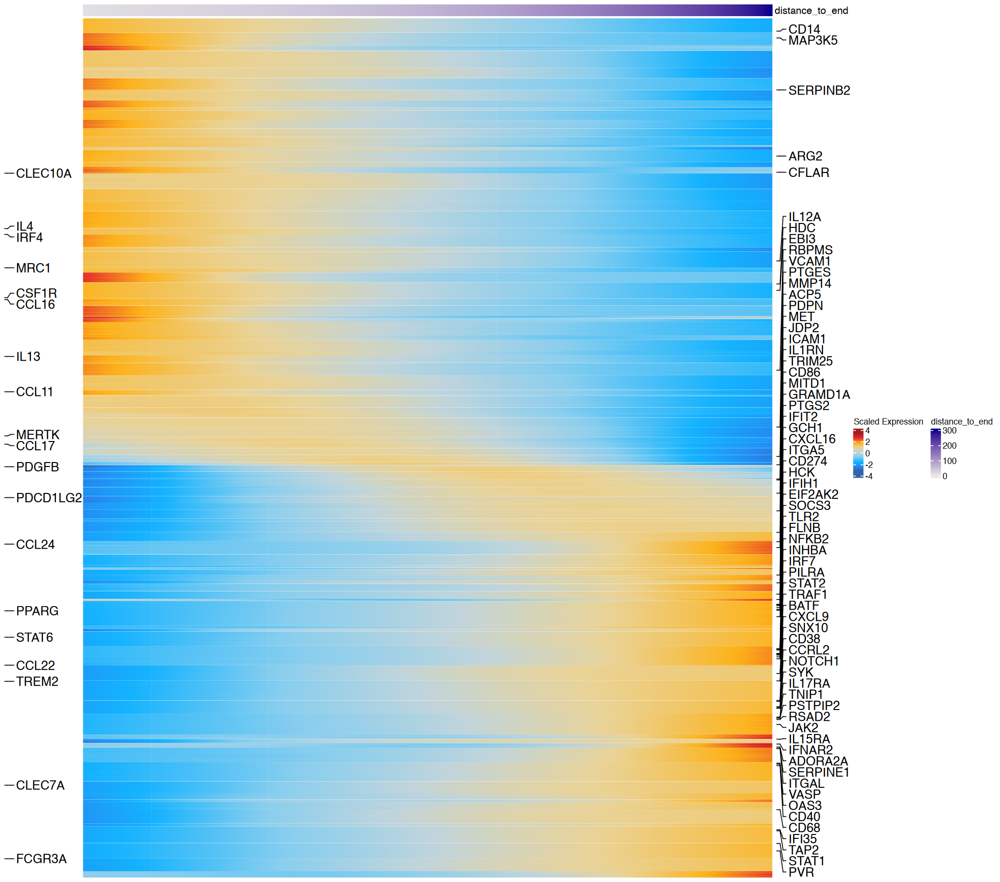

In [10]:
options(repr.plot.width = 17, repr.plot.height = 15)
draw(htkm)

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


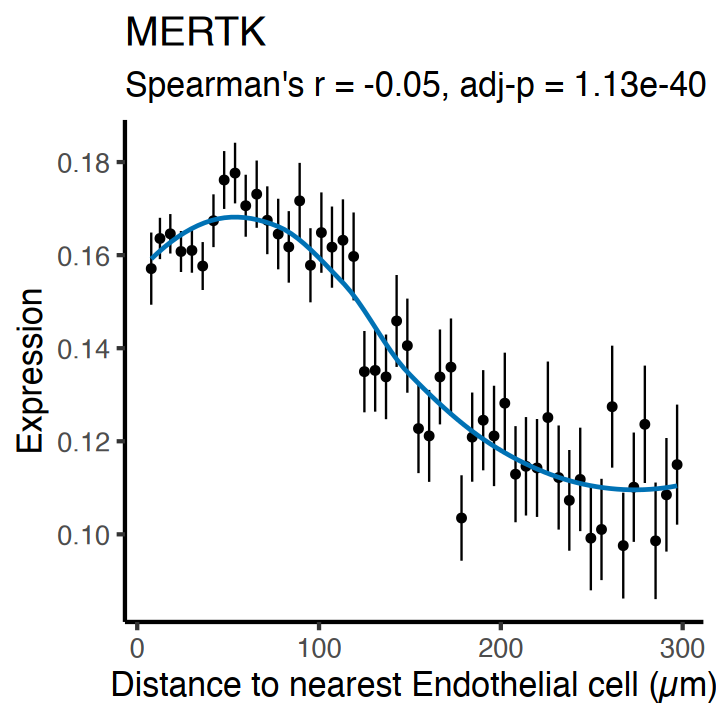

`geom_smooth()` using formula = 'y ~ x'


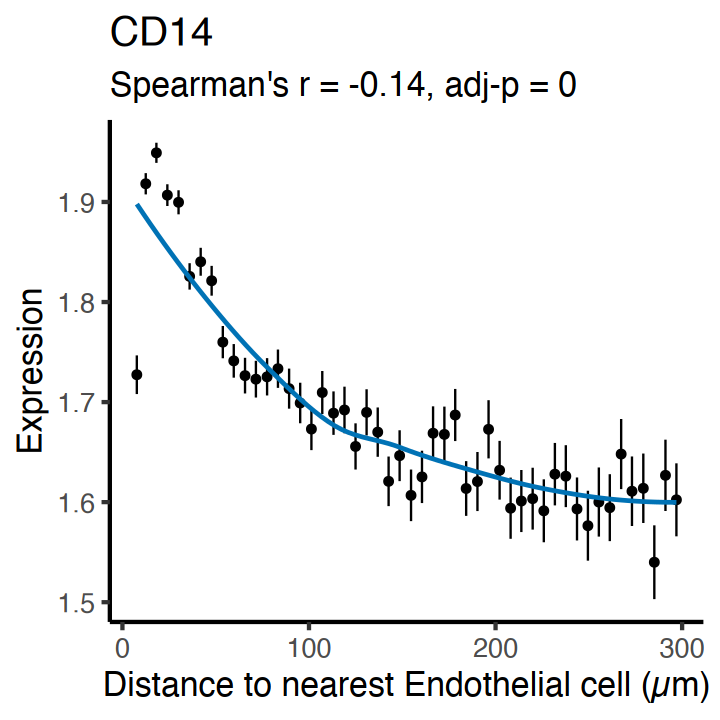

`geom_smooth()` using formula = 'y ~ x'


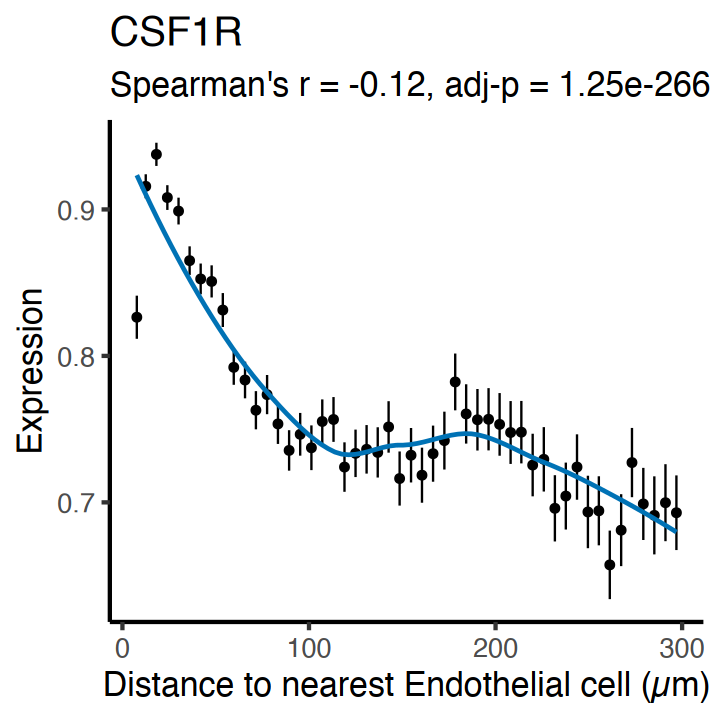

`geom_smooth()` using formula = 'y ~ x'


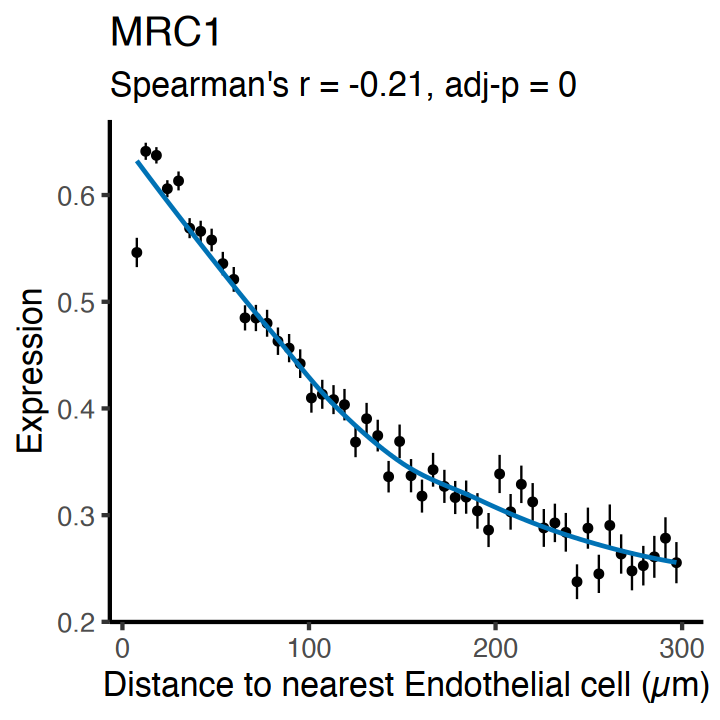

`geom_smooth()` using formula = 'y ~ x'


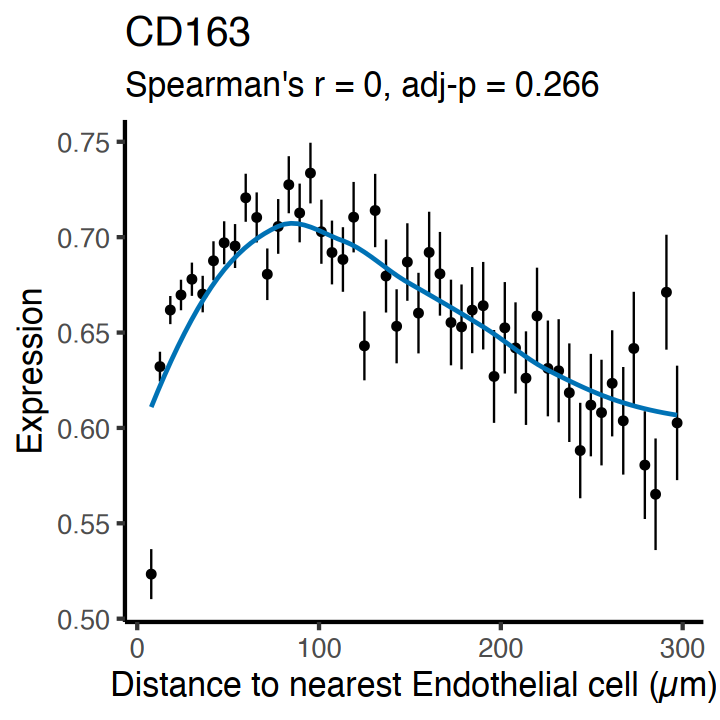

`geom_smooth()` using formula = 'y ~ x'


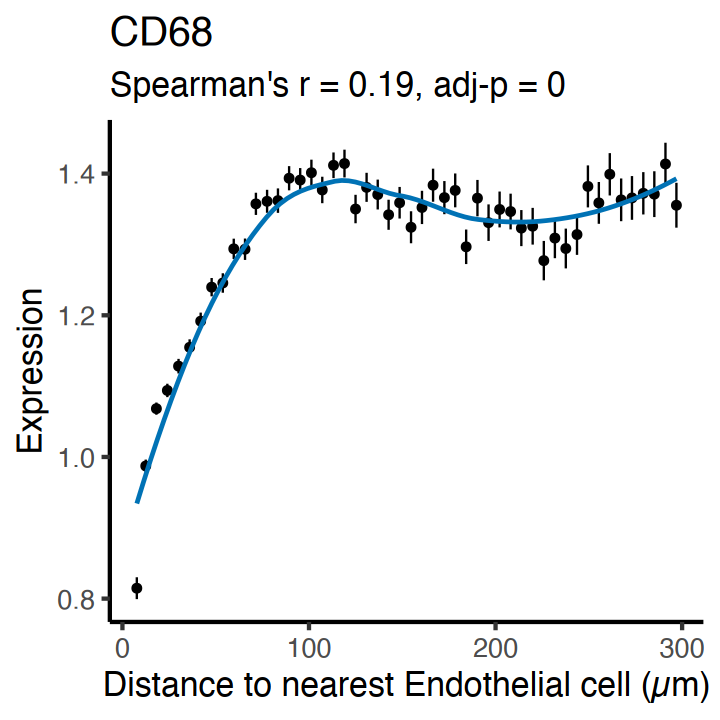

`geom_smooth()` using formula = 'y ~ x'


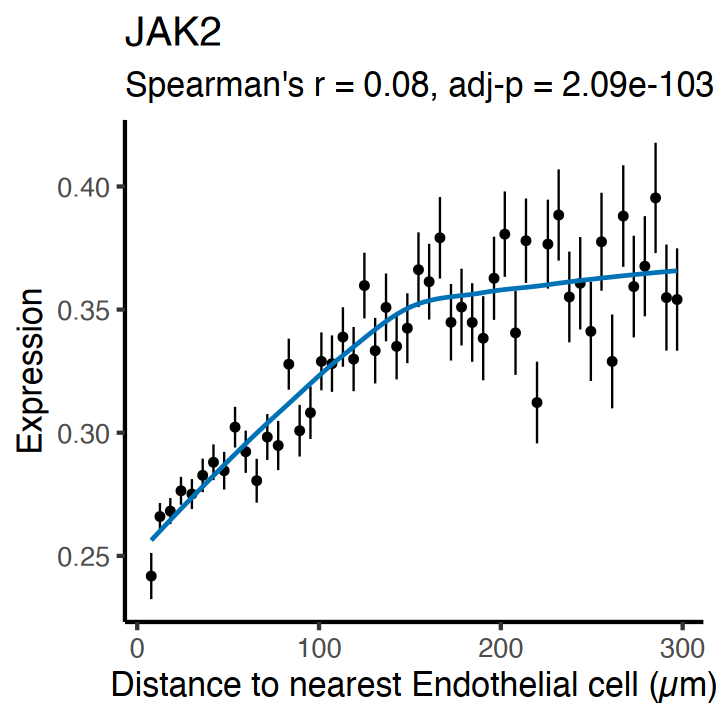

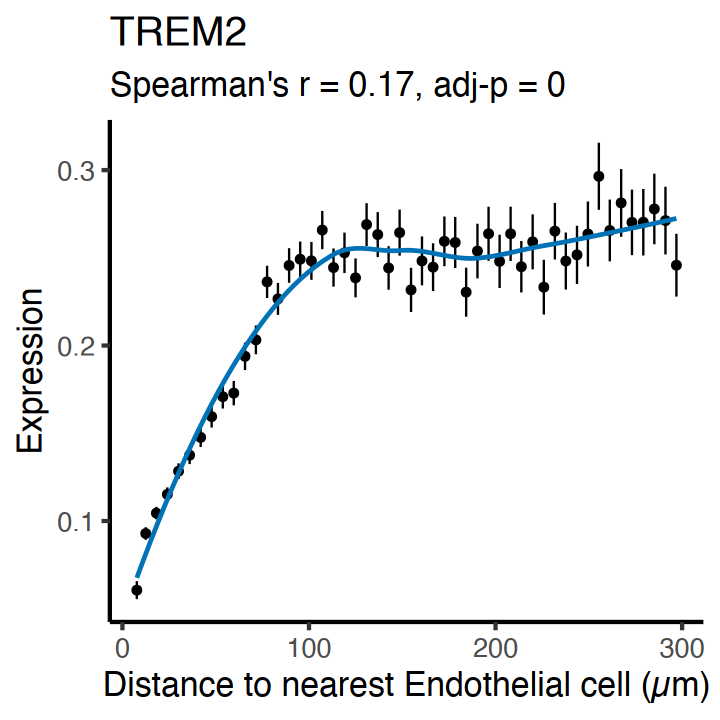

In [11]:

coords_df = data.frame()
for (name in c("SB4","SB14","SB10","SB19","SB25","SB21","SB29","SB30","SB62")) {
  coords <- ste[[name]]$centroids@coords %>%
    as.data.frame() %>%
    dplyr::mutate(cell = Cells(ste[[name]]))
  cells <- coords$cell
  rownames(coords) <- cells
  coords <- as.matrix(coords[, c("x", "y")])
  dim(coords)
  coords_df_ = as.data.frame(coords) %>%
    dplyr::mutate(cell_id = cells,
                  sample_id = name) %>%
    dplyr::left_join(.,ste@meta.data[,c("cell",cluster_col)] %>% dplyr::rename(cell_id = cell),by="cell_id")
  
  end_cells <- coords_df_ %>% dplyr::filter(grepl("arteriolar|venule",!!sym(cluster_col)))
  mac_cells <- coords_df_ %>% dplyr::filter(grepl("macrophage",!!sym(cluster_col)))
  
  res <- RANN::nn2(data = end_cells[,1:2], query = mac_cells[,1:2], k = 1)
  
  dist_to_nearest_end <- res$nn.dists[, 1] 

  mac_cells$dist_nearest_end <- dist_to_nearest_end
  
  coords_df = rbind(coords_df, mac_cells)
}
coords_df = coords_df %>%
  dplyr::left_join(.,
                   t(ste[["SCT"]]$data[,coords_df$cell_id]) %>%
                     as.data.frame() %>%
                     dplyr::mutate(cell_id = coords_df$cell_id),
                   by="cell_id")
coords_df = coords_df %>%
  dplyr::filter(dist_nearest_end < max_dist) 


gene_cols <- names(coords_df)[7:ncol(coords_df)]

res_list <- lapply(gene_cols, function(g) {
  test_res <- cor.test(coords_df[["dist_nearest_end"]], coords_df[[g]], 
                       method = "spearman",  
                       use = "pairwise.complete.obs")
  c(correlation = test_res$estimate, pval = test_res$p.value)
})

res_cor_df <- do.call(rbind, res_list) |> 
  as.data.frame()

res_cor_df$gene <- gene_cols

res_cor_df$adj_pval <- p.adjust(res_cor_df$pval, method = "BH")

options(repr.plot.width = 6, repr.plot.height = 6)
for(GENE in c("MERTK","CD14","CSF1R","MRC1","CD163","CD68","JAK2","TREM2")){
  coef = res_cor_df %>%
    dplyr::filter(gene == GENE) %>%
    .[,"correlation.rho"]
  adj_pval = res_cor_df %>%
    dplyr::filter(gene == GENE) %>%
    .[,"adj_pval"]
  
  df_plot <- coords_df %>%
    dplyr::select(cell_id, dist_nearest_end, all_of(GENE)) %>%
    dplyr::rename(gene_expr = !!GENE) %>%  
    dplyr::filter(!is.na(dist_nearest_end), !is.na(gene_expr))
  
  n_bins <- 50
  df_binned <- df_plot %>%
    dplyr::mutate(
      dist_bin = cut(dist_nearest_end, breaks = n_bins) 
    ) %>%
    dplyr::group_by(dist_bin) %>%
    dplyr::summarise(
      dist_mean   = mean(dist_nearest_end),
      expr_mean   = mean(gene_expr),
      expr_sd     = sd(gene_expr),
      n          = n(),
      .groups = "drop"
    ) %>%
    dplyr::mutate(expr_se = expr_sd / sqrt(n)) %>% 
    dplyr::filter(n > 10)
  
  p <- ggplot() +
    geom_errorbar(
      data = df_binned,
      aes(x = dist_mean, ymin = expr_mean - expr_se, ymax = expr_mean + expr_se),
      width = 0, color = "black"
    ) +
    geom_point(
      data = df_binned,
      aes(x = dist_mean, y = expr_mean),
      color = "black", size = 2
    ) +
    geom_smooth(
      data = df_binned,
      aes(x = dist_mean, y = expr_mean),
      method = "loess", se = FALSE, color = "#0072B5FF"
    ) +
    theme_classic(base_size = 20) +
    labs(
      x = "Distance to nearest Endothelial cell (µm)",
      y = paste("Expression"),
      title = GENE,
      subtitle = paste0(
        "Spearman's r = ", round(coef, 2),
        ", adj-p = ", signif(adj_pval, 3)
      )
    )
  plot(p)
}



### Colocalization score analysis for macrophage and T cells

```r
# Local Co-occur score for fine scaled cell clusters
ste@meta.data[,grep("^cooccur_local_",colnames(ste@meta.data))] = NULL
print("Local Co-occur score for fine-scaled cell types:")
cluster_pair_df = expand.grid(
  cluster1 = unique(ste@meta.data[,cluster_col]),
  cluster2 = unique(ste@meta.data[,cluster_col]),
  stringsAsFactors = FALSE
) %>%
  dplyr::filter(cluster1 != cluster2) %>%
  dplyr::rowwise() %>%
  dplyr::mutate(
    sorted = list(sort(c(cluster1, cluster2)))
  ) %>%
  dplyr::mutate(
    cluster1_sorted = sorted[[1]],
    cluster2_sorted = sorted[[2]]
  ) %>%
  dplyr::ungroup() %>%
  dplyr::select(-sorted) %>%
  dplyr::distinct(cluster1_sorted, cluster2_sorted, .keep_all = TRUE) %>%
  as.data.frame() %>%
  dplyr::select(cluster1 , cluster2) %>%
  dplyr::arrange(cluster1, cluster2) 

result_list <- mclapply(
  X        = seq_len(nrow(cluster_pair_df)),
  FUN      = function(j) {
    cluster_x <- cluster_pair_df$cluster1[j]
    cluster_y <- cluster_pair_df$cluster2[j]
    
    df_tmp <- cooccur_local(
      ste,
      cluster_x        = cluster_x,
      cluster_y        = cluster_y,
      connectivity_key = "nn",
      cluster_key      = cluster_col,
      sample_key       = "sample_id",
      neighbors.k      = 30, 
      radius           = 10
    )
    
    return(df_tmp)
  },
  mc.cores = n_jobs
)
good_idx <- sapply(result_list, function(x) !inherits(x, "try-error"))
result_lists <- result_list[good_idx]
cooccur_local_df <- do.call(cbind, result_lists)
colnames(cooccur_local_df) = colnames(cooccur_local_df) %>%
  gsub(":", "--", .) %>%
  gsub(" ", "XXX", .) %>%
  gsub("\\+", "YYY", .) %>%
  gsub("ï", "i", ., fixed = TRUE) %>%
  gsub("TPH_TFH", "TPHTFH", .)
if(!is.null(cooccur_local_df)){
  ste = AddMetaData(ste,cooccur_local_df)
}

# Local Co-occur score for broad cell types
print("Local Co-occur score for broad cell types:")
cluster_pair_df = expand.grid(
  cluster1 = unique(ste@meta.data[,"celltype"]),
  cluster2 = unique(ste@meta.data[,"celltype"]),
  stringsAsFactors = FALSE
) %>%
  dplyr::filter(cluster1 != cluster2) %>%
  dplyr::rowwise() %>%
  dplyr::mutate(
    sorted = list(sort(c(cluster1, cluster2)))
  ) %>%
  dplyr::mutate(
    cluster1_sorted = sorted[[1]],
    cluster2_sorted = sorted[[2]]
  ) %>%
  dplyr::ungroup() %>%
  dplyr::select(-sorted) %>%
  dplyr::distinct(cluster1_sorted, cluster2_sorted, .keep_all = TRUE) %>%
  as.data.frame() %>%
  dplyr::select(cluster1 , cluster2) %>%
  dplyr::arrange(cluster1, cluster2) 

result_list <- mclapply(
  X        = seq_len(nrow(cluster_pair_df)),
  FUN      = function(j) {
    cluster_x <- cluster_pair_df$cluster1[j]
    cluster_y <- cluster_pair_df$cluster2[j]
    
    df_tmp <- cooccur_local(
      ste,
      cluster_x        = cluster_x,
      cluster_y        = cluster_y,
      connectivity_key = "nn",
      cluster_key      = "celltype",
      sample_key       = "sample_id",
      neighbors.k      = 30, 
      radius           = 10
    )
    
    return(df_tmp)
  },
  mc.cores = n_jobs
)
good_idx <- sapply(result_list, function(x) !inherits(x, "try-error"))
result_lists <- result_list[good_idx]
cooccur_local_df <- do.call(cbind, result_lists)
if(!is.null(cooccur_local_df)){
  ste = AddMetaData(ste,cooccur_local_df)
}

```

In [12]:
cooccur_local_df = ste@meta.data[,colnames(ste@meta.data)[grep("^cooccur_local_",colnames(ste@meta.data))]] 
non_zero_pair = names(matrixStats::colVars(as.matrix(cooccur_local_df))[matrixStats::colVars(as.matrix(cooccur_local_df))>0])
print(length(non_zero_pair))

pair_list = "cooccur_local_T_M"

results <- data.frame(
  cooccur_column = character(),
  signal_column = character(),
  correlation = numeric(),
  p_value = numeric(),
  signal_type = character(),
  sample_id = character(),
  stringsAsFactors = FALSE
)

for(sample_id_ in c("SB4","SB14","SB10","SB19","SB25","SB21","SB29","SB30","SB62")) {
  print(Sys.time())
  print(sample_id_)
  tryCatch({
    sce = readRDS(paste0("./output/COMMOT_",sample_id_,"_withoutObsp.rds"))
    
    # Correlation between sender signal and co-occurrence score
    print("Sender signal and co-occurrence score...")
    sort(colVars(reducedDims(sce)[["commot.user_database.sum.sender"]])[colVars(reducedDims(sce)[["commot.user_database.sum.sender"]])>0],decreasing = T) %>% head(20)
    
    df = data.frame(cell = paste0(sample_id_,"_",colData(sce)$cell_id),
                    reducedDims(sce)[["commot.user_database.sum.sender"]]
    ) %>%
      magrittr::set_colnames(c('cell',colnames(reducedDims(sce)[["commot.user_database.sum.sender"]]))) %>%
      dplyr::left_join(.,
                       ste@meta.data[,c("cell",grep("^cooccur_local_",colnames(ste@meta.data),value=TRUE))],
                       by="cell")
    signal_cols <- names(sort(colVars(reducedDims(sce)[["commot.user_database.sum.sender"]])[colVars(reducedDims(sce)[["commot.user_database.sum.sender"]])>0],decreasing = T))
    
    pairs_df <- expand.grid(cooccur_col = pair_list,
                            signal_column = signal_cols,
                            stringsAsFactors = FALSE)
    
    results_list <- mclapply(seq_len(nrow(pairs_df)), function(i) {
      cooccur_col <- pairs_df$cooccur_col[i]
      signal_col  <- pairs_df$signal_column[i]
      
      test <- cor.test(df[[cooccur_col]], df[[signal_col]], 
                       method = "spearman", use = "complete.obs")
      
      data.frame(
        cooccur_column = cooccur_col,
        signal_column  = signal_col,
        correlation    = test$estimate,
        p_value        = test$p.value,
        signal_type    = "sender",
        sample_id      = sample_id_,
        stringsAsFactors = FALSE
      )
    }, mc.cores = 4) 
    
    results <- rbind(results,
                     bind_rows(results_list))
    
    # Correlation between receiver signal and co-occurrence score
    print("Receiver signal and co-occurrence score...")
    df = data.frame(cell = paste0(sample_id_,"_",colData(sce)$cell_id),
                    reducedDims(sce)[["commot.user_database.sum.receiver"]]
    ) %>%
      magrittr::set_colnames(c('cell',colnames(reducedDims(sce)[["commot.user_database.sum.receiver"]]))) %>%
      dplyr::left_join(.,
                       ste@meta.data[,c("cell",grep("^cooccur_local_",colnames(ste@meta.data),value=TRUE))],
                       by="cell")
    signal_cols <- names(sort(colVars(reducedDims(sce)[["commot.user_database.sum.receiver"]])[colVars(reducedDims(sce)[["commot.user_database.sum.receiver"]])>0],decreasing = T))
    
    pairs_df <- expand.grid(cooccur_col = pair_list,
                            signal_column = signal_cols,
                            stringsAsFactors = FALSE)
    
    results_list <- mclapply(seq_len(nrow(pairs_df)), function(i) {
      cooccur_col <- pairs_df$cooccur_col[i]
      signal_col  <- pairs_df$signal_column[i]
      
      test <- cor.test(df[[cooccur_col]], df[[signal_col]], 
                       method = "spearman", use = "complete.obs")
      
      data.frame(
        cooccur_column = cooccur_col,
        signal_column  = signal_col,
        correlation    = test$estimate,
        p_value        = test$p.value,
        signal_type    = "receiver",
        sample_id      = sample_id_,
        stringsAsFactors = FALSE
      )
    }, mc.cores = 4) 
    
    results <- rbind(results,
                     bind_rows(results_list))
    
  }, error = function(e) {
    print(paste("Error at sample_id=", sample_id_, sep=""))
  })
  print(Sys.time())
}

results$adj_pval <- p.adjust(results$p_value, method = "BH")




[1] 727
[1] "2025-07-09 11:25:13 JST"
[1] "SB4"
[1] "Sender signal and co-occurrence score..."
[1] "Receiver signal and co-occurrence score..."
[1] "2025-07-09 11:25:22 JST"
[1] "2025-07-09 11:25:22 JST"
[1] "SB14"
[1] "Sender signal and co-occurrence score..."
[1] "Receiver signal and co-occurrence score..."
[1] "2025-07-09 11:25:27 JST"
[1] "2025-07-09 11:25:27 JST"
[1] "SB10"
[1] "Sender signal and co-occurrence score..."
[1] "Receiver signal and co-occurrence score..."
[1] "2025-07-09 11:25:30 JST"
[1] "2025-07-09 11:25:30 JST"
[1] "SB19"
[1] "Sender signal and co-occurrence score..."
[1] "Receiver signal and co-occurrence score..."
[1] "2025-07-09 11:25:48 JST"
[1] "2025-07-09 11:25:48 JST"
[1] "SB25"
[1] "Sender signal and co-occurrence score..."
[1] "Receiver signal and co-occurrence score..."
[1] "2025-07-09 11:26:08 JST"
[1] "2025-07-09 11:26:08 JST"
[1] "SB21"
[1] "Sender signal and co-occurrence score..."
[1] "Receiver signal and co-occurrence score..."
[1] "2025-07-09 11:26

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


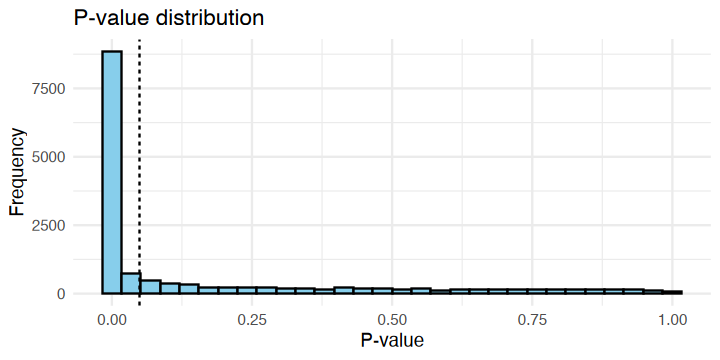

In [13]:
g = ggplot(results, aes(x = p_value)) +
  geom_histogram(fill = "skyblue", color = "black") +
  geom_vline(xintercept = 0.05, linetype = "dashed") +
  labs(title = "P-value distribution",
       x = "P-value",
       y = "Frequency") +
  theme_minimal()

options(repr.plot.width = 6, repr.plot.height = 3)
plot(g)


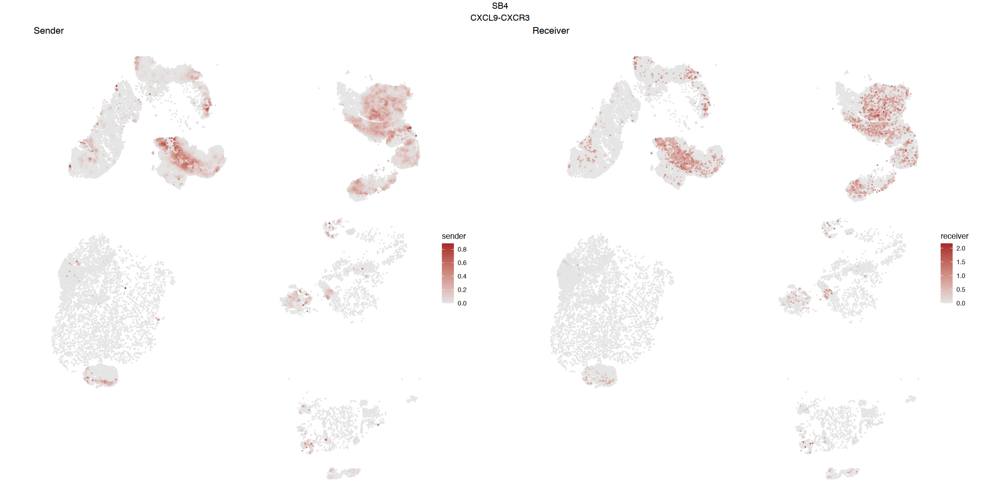

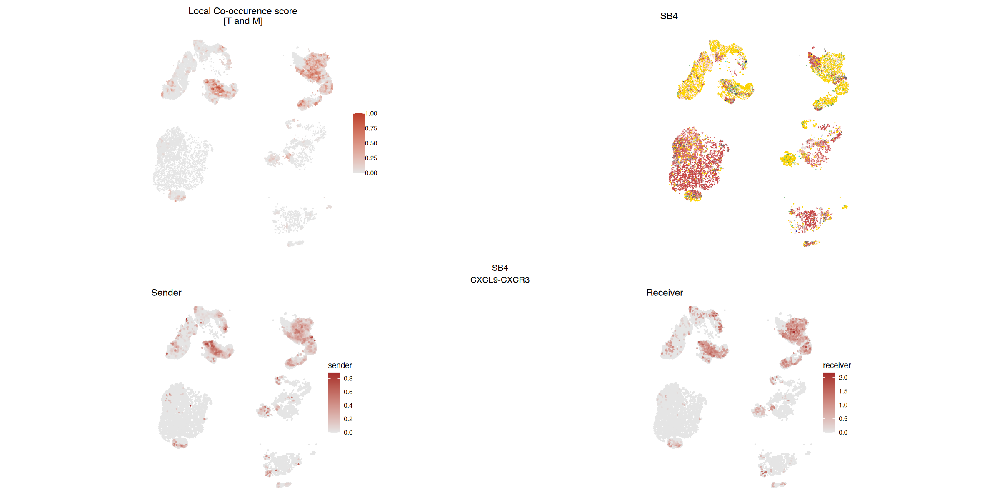

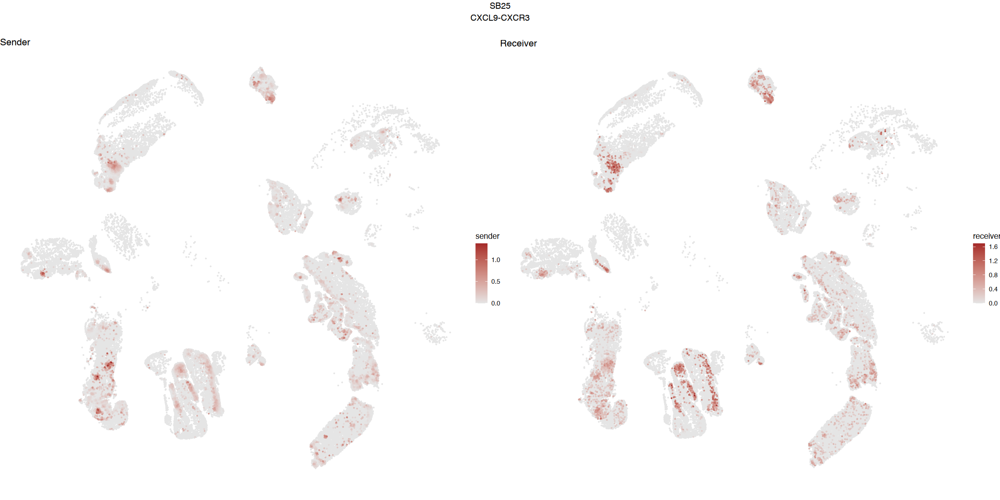

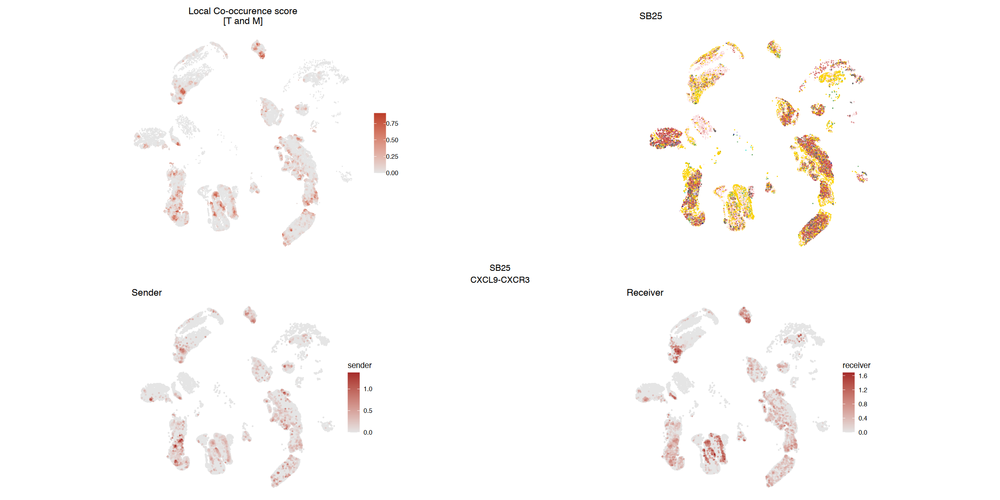

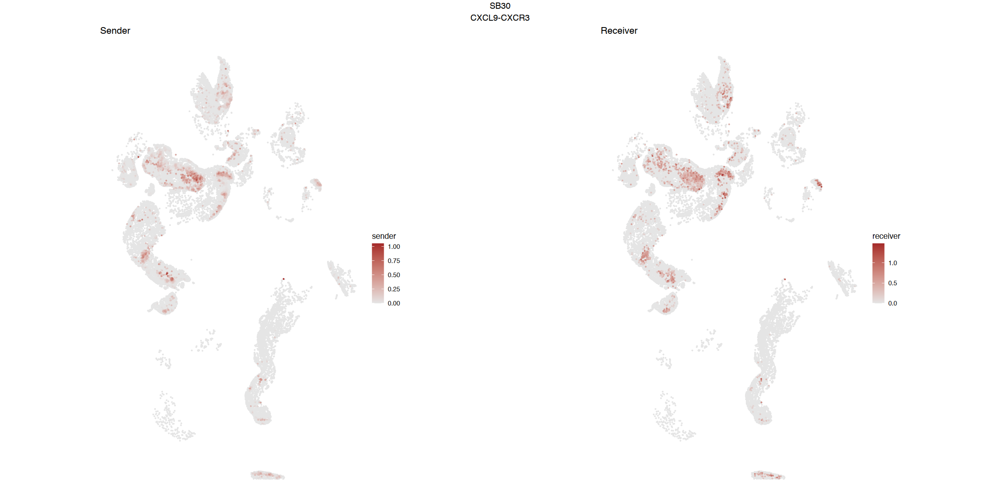

...

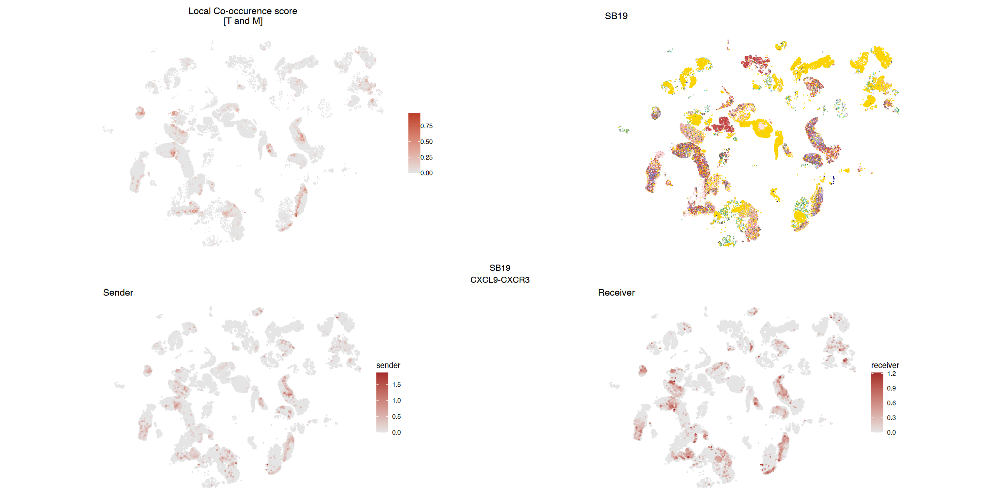

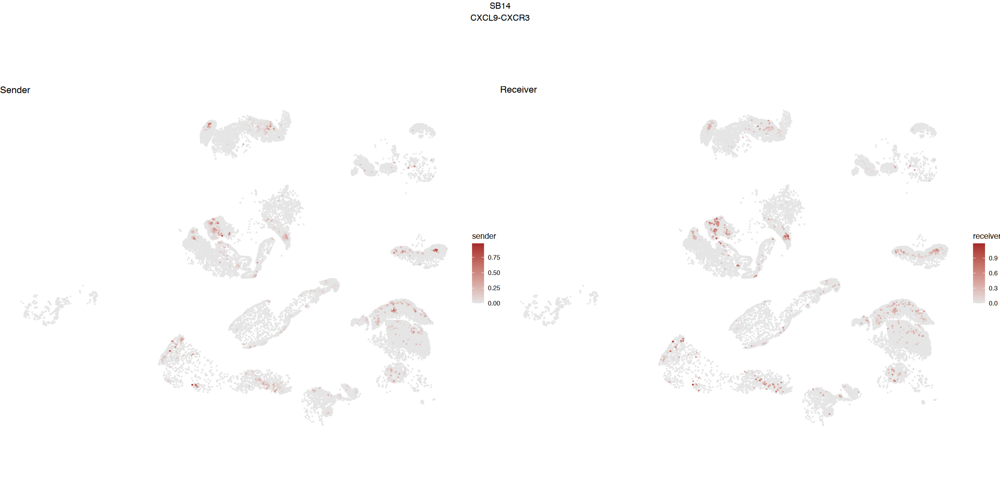

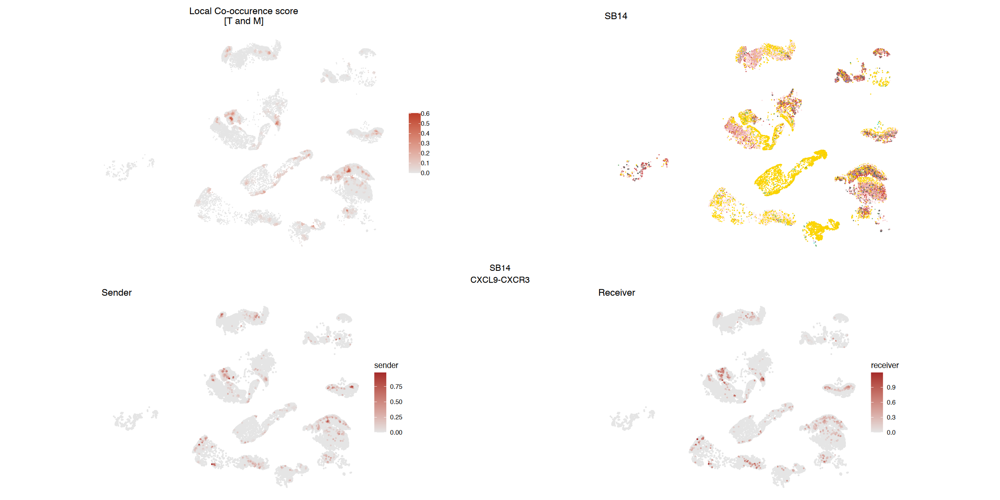

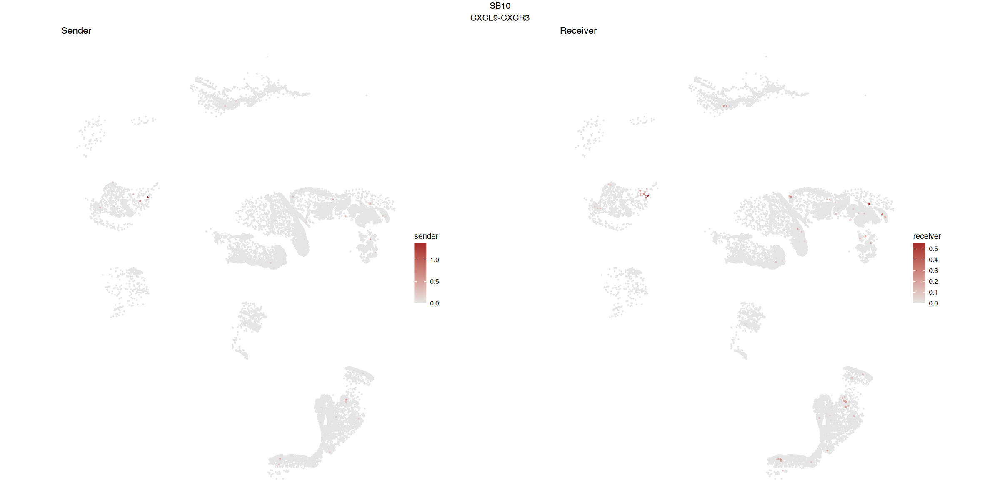

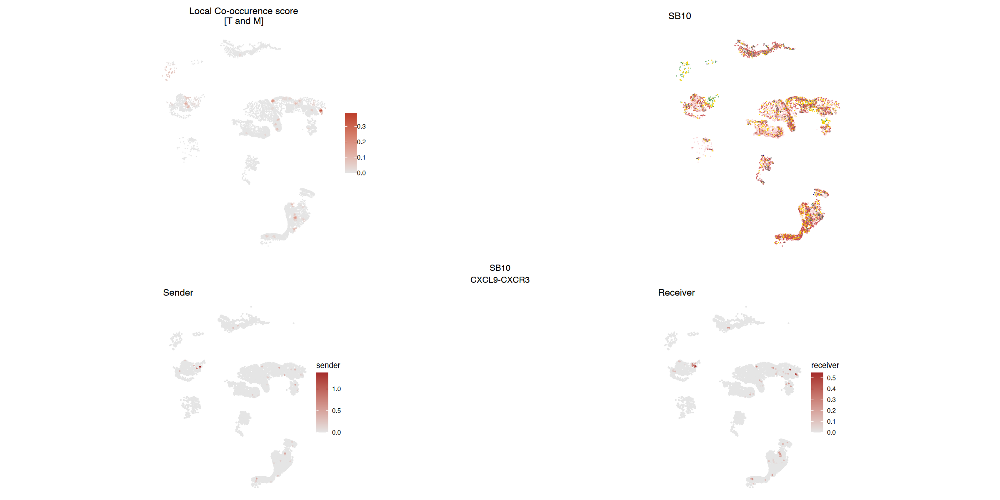

In [14]:
options(repr.plot.width = 20, repr.plot.height = 10)

results_sig = results %>%
  dplyr::filter(adj_pval < 0.05) %>%
  mutate(signal = gsub("^s-","",signal_column) %>% gsub("^r-","",.)) %>%
  dplyr::group_by(signal,sample_id,cooccur_column) %>%
  dplyr::mutate(count = n(),
                mean_correlation = mean(correlation)) %>%
  as.data.frame() %>%
  dplyr::filter(count>1) %>%
  dplyr::select(-count) %>%
  dplyr::arrange(desc(mean_correlation), signal)
results_sig$cluster_x = stringr::str_split(results_sig[,"cooccur_column"], "_", simplify = TRUE)[,3] %>%
  gsub("--", ":", .) %>%
  gsub("XXX", " ", .) %>%
  gsub("YYY", "+", .) %>%
  gsub("naive", "naïve", ., fixed = TRUE) %>%
  gsub("TPHTFH", "TPH_TFH", ., fixed = TRUE)
results_sig$cluster_y = stringr::str_split(results_sig[,"cooccur_column"], "_", simplify = TRUE)[,4] %>%
  gsub("--", ":", .) %>%
  gsub("XXX", " ", .) %>%
  gsub("YYY", "+", .) %>%
  gsub("naive", "naïve", ., fixed = TRUE) %>%
  gsub("TPHTFH", "TPH_TFH", ., fixed = TRUE)

# just focus on CXCL9-CXCR3
results_sig %<>%
  dplyr::filter(signal=="CXCL9-CXCR3")
results_sig_ = results_sig %>%
  dplyr::filter(grepl("-",signal))
viz_list = min(100,nrow(results_sig))

for(i in seq(1,viz_list,2)){
  tryCatch({
    results_sig_[i,]
    results_sig_[i+1,]
    cluster_x = results_sig_[i,"cluster_x"]
    cluster_y = results_sig_[i,"cluster_y"]
    sample_id_ = results_sig_[i,"sample_id"]
    pathwayName=results_sig_[i,"signal"]
    results_sig %>%
      dplyr::filter(signal == pathwayName) 
    
    g1 = ImageFeaturePlot(ste, 
                          features = results_sig[i,"cooccur_column"], 
                          size = 0.5, 
                          fov = results_sig_[i,"sample_id"],
                          cols = c("grey90", "#BC3C29FF"),
                          dark.background = F) &
      ggtitle(paste0("Local Co-occurence score\n[",cluster_x," and ", cluster_y,"]")) &
      scale_color_gradient(low = "grey90", high = "#BC3C29FF") &
      theme(legend.position = "right",
            legend.title = element_text(size = 0)) &
      guides(color = guide_legend(override.aes = list(size=5,
                                                      alpha = 1),
                                  title = "Co-occurence",
                                  ncol = 1))
    
    g2 = ImageDimPlot(ste, 
                      cols = cluster_COLORS__, 
                      size = 0.5, 
                      fov = results_sig_[i,"sample_id"],
                      border.color = "grey90",
                      border.size = 0.001,
                      dark.background = F) &
      ggtitle(paste0(results_sig_[i,"sample_id"])) &
      NoLegend()
    
    sce = readRDS(paste0("./output/COMMOT_",results_sig_[i,"sample_id"],"_withoutObsp.rds"))
    
    g_sender = data.frame(reducedDims(sce)[["spatial"]],
                          sender = reducedDims(sce)[["commot.user_database.sum.sender"]][,paste0('s-',pathwayName)],
                          receiver = reducedDims(sce)[["commot.user_database.sum.receiver"]][,paste0('r-',pathwayName)]) %>%
      dplyr::arrange(sender) %>%
      magrittr::set_colnames(c('imagecol','imagerow','sender','receiver')) %>%
      ggplot(aes(x = imagerow, y = imagecol, color = sender)) +
      geom_point_rast(size = 0.3) +
      scale_color_gradient(low = "grey90", high = "brown") +
      coord_fixed() +
      theme_void() +
      labs(title = "Sender")
    g_receiver = data.frame(reducedDims(sce)[["spatial"]],
                            sender = reducedDims(sce)[["commot.user_database.sum.sender"]][,paste0('s-',pathwayName)],
                            receiver = reducedDims(sce)[["commot.user_database.sum.receiver"]][,paste0('r-',pathwayName)]) %>%
      dplyr::arrange(receiver) %>%
      magrittr::set_colnames(c('imagecol','imagerow','sender','receiver')) %>%
      ggplot(aes(x = imagerow, y = imagecol, color = receiver)) +
      geom_point_rast(size = 0.3) +
      scale_color_gradient(low = "grey90", high = "brown") +
      coord_fixed() +
      theme_void() +
      labs(title = "Receiver")
    g = gridExtra::grid.arrange(g_sender, g_receiver, ncol = 2, top = paste0(sample_id_,"\n",pathwayName))
    
    plot((g1 | g2) / g)
    
  }, error = function(e) {
    print("Error at ", i)
  })
}



